In [44]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt


from time import perf_counter

class SID:
    """
    Implements Spacing-Increasing Discretization as described in the DORN paper.

    Discretizes the region [alpha, beta]
    Offset controls spacing even further by discretizing [alpha + offset, beta + offset] and then
    subtracting offset from all bin edges.

    Bonus: Includes support for when the index is -1 (in which case the value should be alpha)
    and when it is sid_bins (in which case the value should be beta).

    Works in numpy.
    """
    def __init__(self, sid_bins, alpha, beta, offset):
        self.sid_bins = sid_bins
        self.alpha = alpha
        self.beta = beta
        self.offset = offset

        # Derived quantities
        self.alpha_star = self.alpha + offset
        self.beta_star = self.beta + offset
        bin_edges = np.array(range(sid_bins + 1)).astype(np.float32)
        self.sid_bin_edges = np.array(np.exp(np.log(self.alpha_star) +
                                             bin_edges / self.sid_bins * np.log(self.beta_star / self.alpha_star)))
        self.sid_bin_values = (self.sid_bin_edges[:-1] + self.sid_bin_edges[1:]) / 2 - self.offset
        self.sid_bin_values = np.append(self.sid_bin_values, [self.alpha, self.beta])
        # Do the above so that:
        # self.sid_bin_values[-1] = self.alpha < self.sid_bin_values[0]
        # and
        # self.sid_bin_values[sid_bins] = self.beta > self.sid_bin_values[sid_bins-1]

    def get_sid_index_from_value(self, arr):
        """
        Given an array of values in the range [alpha, beta], return the
        indices of the bins they correspond to
        :param arr: The array to turn into indices.
        :return: The array of indices.
        """
        sid_index = np.floor(self.sid_bins * (np.log(arr + self.offset) - np.log(self.alpha_star)) /
                                             (np.log(self.beta_star) - np.log(self.alpha_star))).astype(np.int32)
        sid_index = np.clip(sid_index, a_min=-1, a_max=self.sid_bins)
        # An index of -1 indicates alpha, while self.sid_bins indicates beta
        return sid_index

    def get_value_from_sid_index(self, sid_index):
        """
        Given an array of indices in the range {-1, 0,...,sid_bins},
        return the representative value of the selected bin.
        :param sid_index: The array of indices.
        :return: The array of values correspondding to those indices
        """
        return np.take(self.sid_bin_values, sid_index)

    def __repr__(self):
        return repr((self.sid_bins, self.alpha, self.beta, self.offset))


In [128]:
# %%writefile spad_utils.py
# %load spad_utils.py
import numpy as np
from scipy.signal import fftconvolve
import cvxpy as cp

def simulate_spad(depth_truth, intensity, mask, min_depth, max_depth,
                  spad_bins, photon_count, dc_count, fwhm_ps,
                  use_poisson, use_intensity, use_squared_falloff,
                  use_jitter):
    """
    Works in numpy.
    :param depth_truth: The ground truth depth map (z, not distance...)
    :param albedo: The albedo map, aligned with the ground truth depth map.
    :param mask: The mask of valid pixels
    :param min_depth: The minimum depth value (used for the discretization).
    :param max_depth: The maximum depth value (used for the discretization).
    :param spad_bins: The number of spad bins to simulate
    :param photon_count: The number of photons to collect
    :param dc_count: The additional fraction of photons to add to account for dark count + ambient light
    :param fwhm_ps: The full-width-at-half-maximum of the laser pulse jitter
    :param use_poisson: Whether or not to apply poisson noise at the end.
    :param use_intensity: Whether or not to take an intensity image into account when simulating.
    :param use_squared_falloff: Whether or not to take the squared depth into account when simulating
    :return: A simulated spad.
    """
    weights = mask
    if use_intensity:
        weights = weights * intensity
    if use_squared_falloff:
        weights = weights / (depth_truth ** 2 + 1e-6)
    depth_hist, _ = np.histogram(depth_truth, bins=spad_bins, range=(min_depth, max_depth), weights=weights)

    # Scale by number of photons
    spad_counts = depth_hist * (photon_count / np.sum(depth_hist))

    # Add ambient/dark counts (dc_count) w/ Gaussian noise
    spad_counts += np.ones(len(spad_counts)) * (dc_count / spad_bins) #+ 0.01*np.random.randn(len(spad_counts))

    # Convolve with PSF
    if use_jitter:
        bin_width_m = float(max_depth - min_depth) / spad_bins  # meters/bin
        bin_width_ps = 2 * bin_width_m * 1e12 / (3e8)   # ps/bin, speed of light = 3e8, x2 because light needs to travel there and back.
        fwhm_bin = fwhm_ps / bin_width_ps
        psf = makeGaussianPSF(len(spad_counts), fwhm=fwhm_bin)
        spad_counts = fftconvolve(psf, spad_counts)[:int(spad_bins)]
        spad_counts = np.clip(spad_counts, a_min=0., a_max=None)

    if use_poisson:
        spad_counts = np.random.poisson(spad_counts)
    return spad_counts


def makeGaussianPSF(size, fwhm=3):
    """ Make a gaussian kernel.
    size is the length of the array
    fwhm is full-width-half-maximum, which
    can be thought of as an effective radius.
    """

    x = np.arange(0, size, 1, float)
    x0 = size // 2
    return np.roll(np.exp(-4 * np.log(2) * ((x - x0) ** 2) / fwhm ** 2), len(x) - x0)


def rescale_bins(spad_counts, min_depth, max_depth, sid_obj):
    """
    Works in Numpy
    :param spad_counts: The histogram of spad counts to rescale.
    :param min_depth: The minimum depth of the histogram.
    :param max_depth: The maximum depth of the histogram.
    :param sid_obj: An object representing a SID.
    :return: A rescaled histogram in time to be according to the SID

    Assign photons to sid bins proportionally according to the amount of overlap between
    the sid bin range and the spad_count bin.
    """

    sid_bin_edges_m = sid_obj.sid_bin_edges

    # Convert sid_bin_edges_m into units of spad bins
    sid_bin_edges_bin = sid_bin_edges_m * len(spad_counts) / (max_depth - min_depth)

    # Map spad_counts onto sid_bin indices
    sid_counts = np.zeros(sid_obj.sid_bins)
    for i in range(sid_obj.sid_bins):
        left = sid_bin_edges_bin[i]
        right = sid_bin_edges_bin[i + 1]
        curr = left
        while curr != right:
            curr = np.min([right, np.floor(left + 1.)])  # Don't go across spad bins - stop at integers
            sid_counts[i] += (curr - left) * spad_counts[int(np.floor(left))]
            # Update window
            left = curr
    return sid_counts

def remove_dc_from_spad(noisy_spad, bin_edges, bin_weight, lam=1e-2, eps_rel=1e-5):
    """
    Works in numpy.
    :param noisy_spad: Length C array with the raw spad histogram to denoise.
    :param bin_edges: Length C+1 array with the bin widths in meters of the original bins.
    :param bin_weight: Length C nonnegative array controlling relative strength of L1 regularization on each bin.
    :param lam: float value controlling strength of overall L1 regularization on the signal
    :param eps: float value controlling precision of solver
    """
    assert len(noisy_spad.shape) == 1
    C = noisy_spad.shape[0]
    assert bin_edges.shape == (C+1,)
    bin_widths = bin_edges[1:] - bin_edges[:-1]
    spad_equalized = noisy_spad / bin_widths
    x = cp.Variable((C,), "signal")
    z = cp.Variable((1,), "noise")
    obj = cp.Minimize(cp.sum_squares(spad_equalized - (x + z)) + lam * cp.sum(bin_weight*cp.abs(x)))
    constr = [
        x >= 0,
#         z >= 0
    ]
    prob = cp.Problem(obj, constr)
    prob.solve(solver=cp.OSQP, eps_rel=eps_rel)
    denoised_spad = np.clip(x.value * bin_widths, a_min=0., a_max=None)
    return denoised_spad


def preprocess_spad(spad_sid, sid_obj, correct_falloff, remove_dc, **dc_kwargs):
    if remove_dc:
        spad_sid = remove_dc_from_spad(spad_sid, sid_obj.sid_bin_edges, sid_obj.sid_bin_values[:-2]**2, **dc_kwargs)
    if correct_falloff:
        spad_sid = spad_sid * sid_obj.sid_bin_values[:-2]**2
    return spad_sid


def simulate_spad_sid(depth, intensity, mask, min_depth, max_depth,
                      sid_obj, spad_bins, photon_count, dc_count, fwhm_ps,
                      use_poisson, use_intensity, use_squared_falloff,
                      use_jitter):
    spad_counts = simulate_spad(depth, intensity, mask, min_depth, max_depth,
                                spad_bins, photon_count, dc_count, fwhm_ps,
                                use_poisson, use_intensity, use_squared_falloff,
                                use_jitter)
    spad_sid = rescale_bins(spad_counts, min_depth, max_depth, sid_obj)
    return spad_sid


from collections import OrderedDict
spad_types = OrderedDict([
    ("rawhist", {#Rawhist
        "spad_bins": 1024,
        "photon_count": 1e6,
        "dc_count": 0.,
        "fwhm_ps": 70.,
        "use_poisson": False,
        "use_intensity": False,
        "use_squared_falloff": False,
        "use_jitter": False
    }),
    ("intensity", {#Intensity
        "spad_bins": 1024,
        "photon_count": 1e6,
        "dc_count": 0.,
        "fwhm_ps": 70.,
        "use_poisson": False,
        "use_intensity": True,
        "use_squared_falloff": False,
        "use_jitter": False
    }),
    ("intensity + falloff", {#Intensity + falloff
        "spad_bins": 1024,
        "photon_count": 1e6,
        "dc_count": 0.,
        "fwhm_ps": 70.,
        "use_poisson": False,
        "use_intensity": True,
        "use_squared_falloff": True,
        "use_jitter": False
    }),
    ("intensity + falloff + dc", {#Intensity+falloff+dc
        "spad_bins": 1024,
        "photon_count": 1e6,
        "dc_count": 1e5,
        "fwhm_ps": 70.,
        "use_poisson": False,
        "use_intensity": True,
        "use_squared_falloff": True,
        "use_jitter": False
    }),
    ("intensity + falloff + dc + jitter", {#Intensity+falloff+dc+jitter
        "spad_bins": 1024,
        "photon_count": 1e6,
        "dc_count": 1e5,
        "fwhm_ps": 70.,
        "use_poisson": False,
        "use_intensity": True,
        "use_squared_falloff": True,
        "use_jitter": True
    }),
    ("intensity + falloff + dc + jitter + poisson", {#Intensity+falloff+dc+jitter+poisson
        "spad_bins": 1024,
        "photon_count": 1e6,
        "dc_count": 1e5,
        "fwhm_ps": 70.,
        "use_poisson": True,
        "use_intensity": True,
        "use_squared_falloff": True,
        "use_jitter": True
    })
])


Overwriting spad_utils.py


In [56]:
# Load actual depth image
from matplotlib._png import read_png
orig = read_png("data/4597_depth.png")
orig = (orig - np.min(orig))/(np.max(orig) - np.min(orig))
new_max = 2
new_min = 0.8
sid_obj = SID(sid_bins=68, alpha=0.6569154266167957, beta=9.972175646365525, offset=0)

# Make ground truth
gt = orig * new_max + new_min

# Make shifted image
sh = gt + 1.

# Load RGB image
albedo = read_png("data/4597_albedo.png")
intensity = 0.2989 * albedo[..., 0] + 0.5870 * albedo[..., 1] + 0.1140 * albedo[..., 2]

In [57]:
#%%writefile weighted_histogram_matching.py
# %load weighted_histogram_matching.py
import numpy as np

def find_movement(hist_from, hist_to):
    """Gives the movements from hist_from (column sum)
    to hist_to (row sum).

    Based on Morovic et. al 2002 A fast, non-iterative, and exact histogram matching algorithm.

    hist_from and hist_to should sum to the same value
    """
    movement = np.zeros((len(hist_from), len(hist_to)))
    for row in range(len(hist_from)):
        for col in range(len(hist_to)):
#             if col == 5:
#                 print("movement", np.sum(movement[:row, col]))
            pixels_rem = hist_from[row] - np.sum(movement[row, :col])
            pixels_req = hist_to[col] - np.sum(movement[:row, col])
#             if np.minimum(pixels_rem, pixels_req) < 0:
#                 print(row, col)
#                 print(hist_from[row])
#                 print(hist_to[col])
#                 print("pixels_rem", pixels_rem)
#                 print("pixels_req", pixels_req)

#                 raise Exception()
#             if col == 5:
#                 print("pixels_req", pixels_req)
#                 print("movement", np.sum(movement[:row, col]))
            movement[row, col] = np.clip(np.minimum(pixels_rem, pixels_req), a_min=0., a_max=None)
    return movement


def move_pixels(T, init_index, weights):
    assert init_index.shape == weights.shape
    pred_index = np.zeros_like(init_index)
    cpfs = np.cumsum(T, axis=1)

    
    for row in range(init_index.shape[0]):
        for col in range(init_index.shape[1]):
            i = init_index[row, col]
            cpf = cpfs[i]
            p = np.random.uniform(0, cpf[-1])
            for j in range(len(cpf)):
                if cpf[j] >= p:
                    pred_index[row, col] = j
                    if T[i,j] > weights[row, col]:
                        # Leave some small positive mass here so that future pixels don't clip to 0.
                        T[i, j] = T[i, j] - weights[row, col]
                    break
    return pred_index


def move_pixels_vectorized(T, init_index, weights):
    assert init_index.shape == weights.shape
    pred_index = np.zeros_like(init_index)
    cpfs = np.cumsum(T, axis=1)  # Sum across columns
    pixel_cpfs = cpfs[init_index, :]  # Per-pixel cpf, cpf goes along axis 2
    p = np.random.uniform(0., pixel_cpfs[..., -1], size=init_index.shape)  # Generate 1 random number for each pixel
    # Use argmax trick to get first index k where p[i,j] < pixel_cpfs[i,j,k] for all i,j
    pred_index = (np.expand_dims(p, 2) < pixel_cpfs).argmax(axis=2)
    return pred_index


def move_pixels_raster(T_count, init_index, weights):
    assert init_index.shape == weights.shape
    marginal_nonzero = np.nonzero(np.sum(T_count, axis=1))[0]
    pred_index = np.zeros_like(init_index)
    index_sets = [np.where(init_index == bin_index) for bin_index in range(T_count.shape[1])]
    for old_bin in marginal_nonzero:  # Indexes rows
        possible_bins = np.nonzero(T_count[old_bin, :])[0]
        curr = 0  # Indexes current pixel
        rows, cols = index_sets[old_bin]
        for new_bin in possible_bins[:-1]:  # Indexes columns
            weight_to_move = T_count[old_bin, new_bin]
            weight_moved = 0.
            while weight_moved < weight_to_move and curr < len(rows):
                pred_index[rows[curr], cols[curr]] = new_bin
                weight_moved += weights[rows[curr], cols[curr]]
                curr += 1
        while curr < len(rows):
            pred_index[rows[curr], cols[curr]] = possible_bins[-1]
            curr += 1
    return pred_index


def image_histogram_match(init, gt_hist, weights, sid_obj):
    weights = weights * (np.sum(gt_hist) / np.sum(weights))
    init_index = np.clip(sid_obj.get_sid_index_from_value(init), a_min=0, a_max=sid_obj.sid_bins - 1)
    init_hist, _ = np.histogram(init_index, weights=weights, bins=range(sid_obj.sid_bins + 1))
    if (gt_hist < 0).any():
        print("Negative values in gt_hist")
        raise Exception()
    T_count = find_movement(init_hist, gt_hist)
#     pred_index = move_pixels_raster(T_count, init_index, weights)
#     pred_index = move_pixels(T_count, init_index, weights)
#     pred_index = move_pixels_better(T_count, init_index, weights)
    pred_index = move_pixels_vectorized(T_count, init_index, weights)
    pred = sid_obj.get_value_from_sid_index(pred_index)
    pred_hist, _ = np.histogram(pred_index, weights=weights, bins=range(len(gt_hist) + 1))
    return pred, (init_index, init_hist, pred_index, pred_hist, T_count)


def summarize_in_subplot(axs, col, img, hist, gt, title):
    axs[0, col].set_title(title, fontsize=24)
    axs[0, col].imshow(img, vmin=0., vmax=10.)
    axs[0, col].axis('off')
    axs[1, col].bar(range(len(hist)), hist)
    rmse = np.sqrt(np.mean((gt - img) ** 2))
    axs[1, col].set_xlabel("RMSE = {:1.3f}".format(rmse), fontsize=24)

In [58]:
def run_and_display(init, gt, init_weights, gt_weights, sid_obj, title, **simulate_kwargs):
    # Scale init_weights and gt_weights to have the same sum:
#     init_weights = init_weights * (init_weights.size/np.sum(init_weights))
#     init_index = np.clip(sid_obj.get_sid_index_from_value(init), a_min=0, a_max=sid_obj.sid_bins-1)
#     init_hist, _ = np.histogram(init_index, weights=init_weights, bins=range(sid_obj.sid_bins + 1))
#     gt_index = np.clip(sid_obj.get_sid_index_from_value(gt), a_min=0, a_max=sid_obj.sid_bins-1)
#     gt_hist, _ = np.histogram(gt_index, weights=gt_weights, bins=range(sid_obj.sid_bins + 1))
    gt_spad = simulate_spad_sid(gt, gt_weights, np.ones_like(gt), min_depth=0., max_depth=10., 
                                sid_obj=sid_obj,
                                **simulate_kwargs)
    gt_hist = preprocess_spad(gt_spad, sid_obj,
                              simulate_kwargs["use_squared_falloff"], simulate_kwargs["dc_count"]>0.,
                              lam=3e2, eps_rel=1e-5)
    
    if (gt_hist < 0).any():
        print("negative values in gt_hist")
    
    start = perf_counter()
    pred, t = image_histogram_match(init, gt_hist, weights=init_weights, sid_obj=sid_obj)
    time = perf_counter() - start
    init_index, init_hist, pred_index, pred_hist, T_count = t
    
    fig, axs = plt.subplots(2, 3, figsize=(30, 10),
                            gridspec_kw = {"wspace": 0.1,
                                           "height_ratios": [3, 1]})
    fontsize=24

    summarize_in_subplot(axs, 0, img=gt, hist=gt_spad, gt=gt,
                         title="Ground Truth ({})".format(title))
    summarize_in_subplot(axs, 1, img=init, hist=init_hist, gt=gt,
                         title="Input ({})".format(title))
    summarize_in_subplot(axs, 2, img=pred, hist=pred_hist, gt=gt,
                         title="Pred ({})".format(title))
    return time


0.25063760000193724

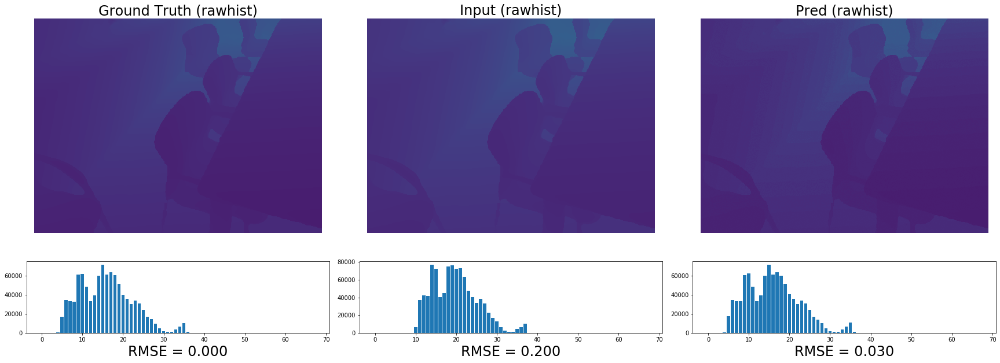

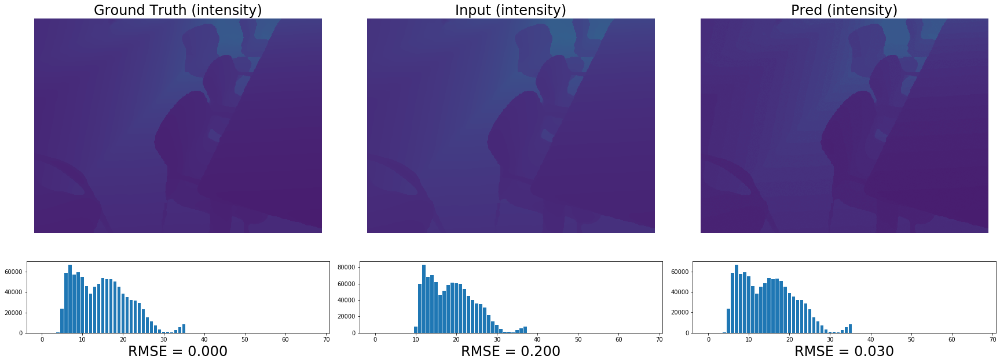

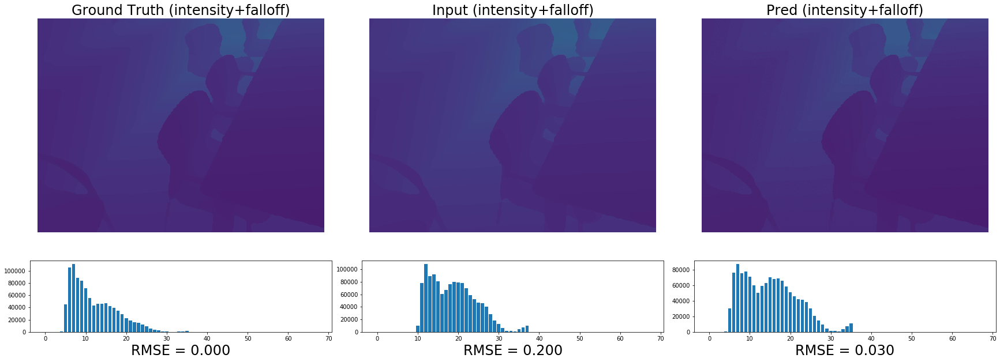

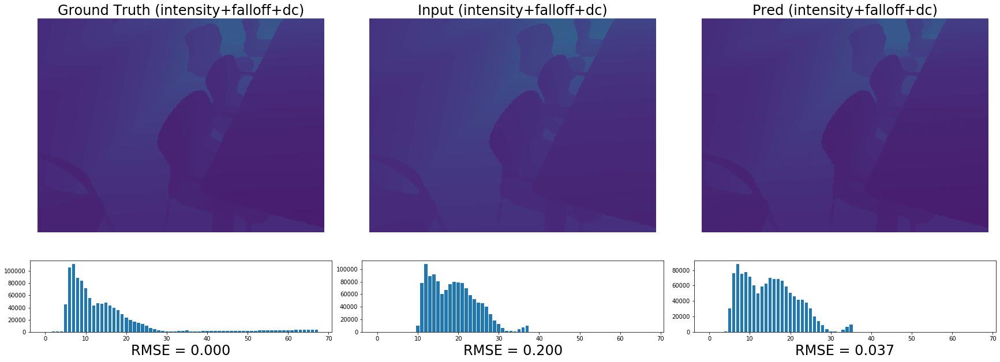

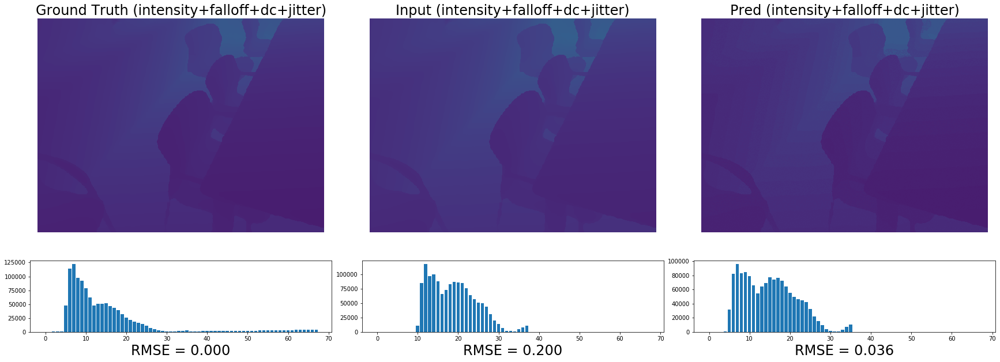

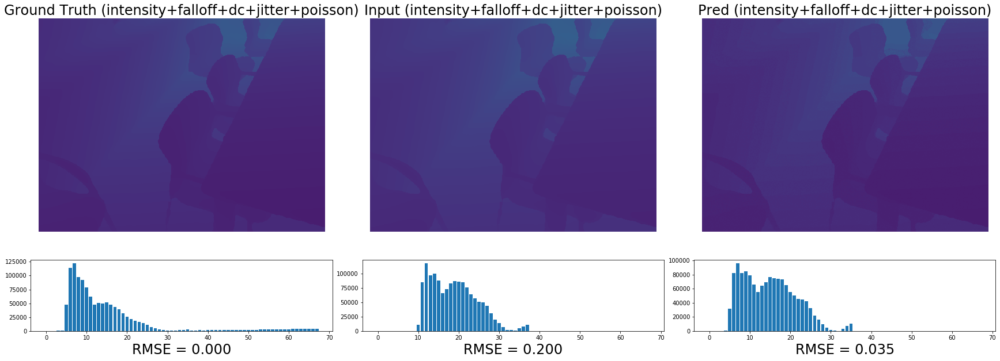

In [59]:
# def simulate_spad_sid(depth, intensity, mask, min_depth, max_depth,
#                       sid_obj, spad_bins, photon_count, dc_count, fwhm_ps,
#                       use_poisson, use_intensity, use_squared_falloff,
#                       use_jitter):
run_and_display(gt+0.2, gt, np.ones_like(gt), np.ones_like(gt), sid_obj, "rawhist", **spad_types["rawhist"])
run_and_display(gt+0.2, gt, intensity, intensity, sid_obj, "intensity", **spad_types["intensity"])
run_and_display(gt+0.2, gt, intensity, intensity, sid_obj, "intensity+falloff", **spad_types["intensity + falloff"])
run_and_display(gt+0.2, gt, intensity, intensity, sid_obj, "intensity+falloff+dc", **spad_types["intensity + falloff + dc"])
run_and_display(gt+0.2, gt, intensity, intensity, sid_obj, "intensity+falloff+dc+jitter", **spad_types["intensity + falloff + dc + jitter"])
run_and_display(gt+0.2, gt, intensity, intensity, sid_obj, "intensity+falloff+dc+jitter+poisson", **spad_types["intensity + falloff + dc + jitter + poisson"])



In [121]:
def run_and_display_gordon(inits, init_weights, titles, gt, gt_weights, sid_obj, **simulate_kwargs):
    assert len(inits) == len(init_weights)
    gt_spad = simulate_spad_sid(gt, gt_weights, np.ones_like(gt), min_depth=0., max_depth=10., 
                                sid_obj=sid_obj,
                                **simulate_kwargs)
    gt_hist = preprocess_spad(gt_spad, sid_obj,
                              simulate_kwargs["use_squared_falloff"], simulate_kwargs["dc_count"]>0.,
                              lam=3e2, eps_rel=1e-5)
    
    ## Initial Images
    fig_init, axs_init = plt.subplots(2, len(inits)+1, figsize=(12*(len(inits)+1), 14),
                            gridspec_kw = {"wspace": 0.1,
                                           "height_ratios": [3, 1]})
    summarize_in_subplot(axs_init, 0, img=gt, hist=gt_spad, gt=gt,
                         title="Ground Truth")
    axs_init[1,0].set_title("Raw SPAD", fontsize=24)
    for i, (init, init_weight) in enumerate(zip(inits, init_weights)):
        init_index = np.clip(sid_obj.get_sid_index_from_value(init), a_min=0, a_max=sid_obj.sid_bins - 1)
        init_hist, _ = np.histogram(init_index, weights=init_weight, bins=range(sid_obj.sid_bins + 1))
        summarize_in_subplot(axs_init, i+1, img=init, hist=init_hist, gt=gt,
                             title="Input ({})".format(titles[i]))
        
    ## Predicted Images
    fig_pred, axs_pred = plt.subplots(2, len(inits)+1, figsize=(12*(len(inits)+1), 14),
                                      gridspec_kw = {"wspace": 0.1,
                                                     "height_ratios": [3, 1]})
    summarize_in_subplot(axs_pred, 0, img=gt, hist=gt_hist, gt=gt,
                         title="Ground Truth")
    axs_pred[1,0].set_title("Denoised SPAD", fontsize=24)
    for i, (init, init_weight) in enumerate(zip(inits, init_weights)):
        pred, t = image_histogram_match(init, gt_hist, weights=init_weight, sid_obj=sid_obj)
        pred_hist = t[3]
        summarize_in_subplot(axs_pred, i+1, img=pred, hist=pred_hist, gt=gt,
                             title="Pred ({})".format(titles[i]))
    return fig_init, fig_pred


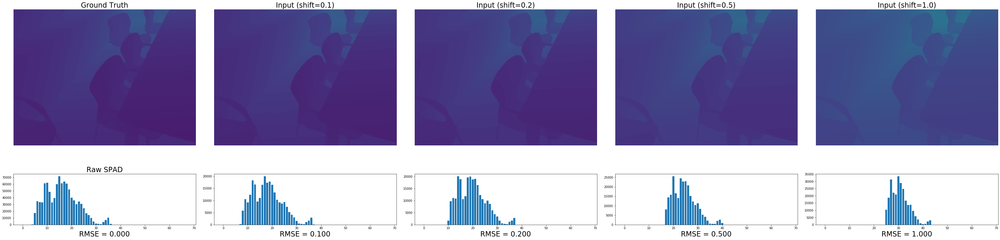

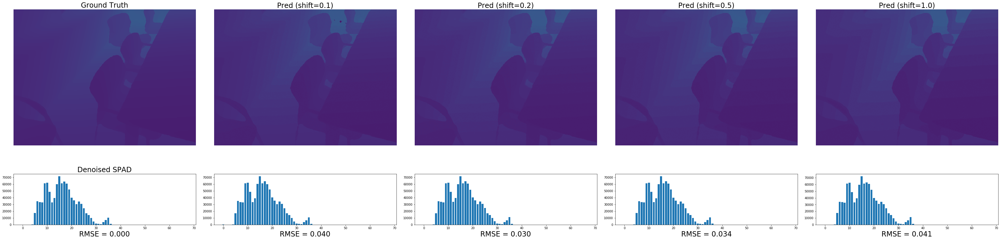

In [122]:
shifts = [0.1, 0.2, 0.5, 1.]
fig_init, fig_pred = run_and_display_gordon([gt+shift for shift in shifts],
                                            [np.ones_like(gt) for shift in shifts],
                                            ["shift={}".format(shift) for shift in shifts],
                                            gt, np.ones_like(gt), sid_obj, **spad_types["rawhist"]);
fig_init.savefig("figures/rawhist_init.png")
fig_pred.savefig("figures/rawhist_pred.png")

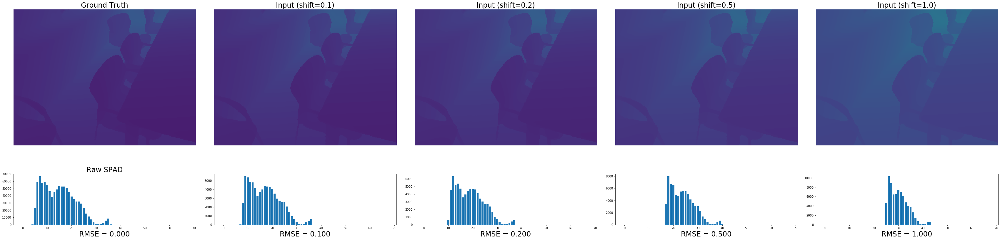

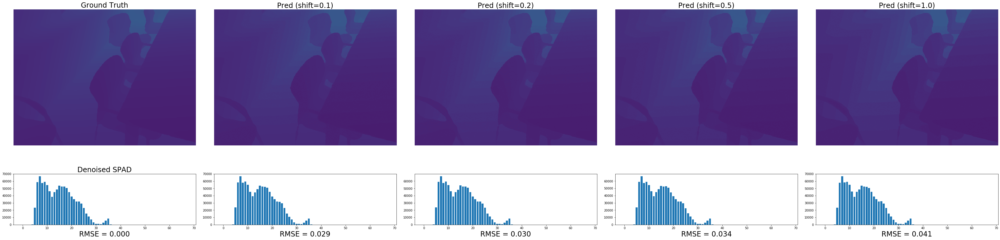

In [123]:
shifts = [0.1, 0.2, 0.5, 1.]
fig_init, fig_pred = run_and_display_gordon([gt+shift for shift in shifts],
                                            [intensity for shift in shifts],
                                            ["shift={}".format(shift) for shift in shifts],
                                            gt, intensity, sid_obj, **spad_types["intensity"]);
fig_init.savefig("figures/int_init.png")
fig_pred.savefig("figures/int_pred.png")

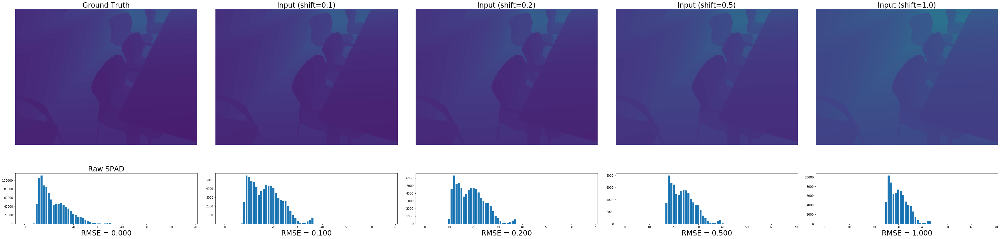

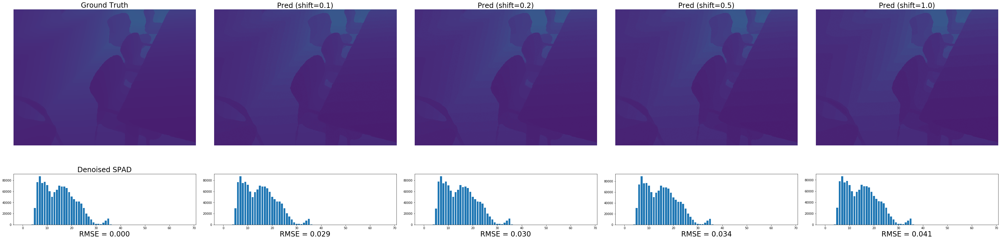

In [124]:
shifts = [0.1, 0.2, 0.5, 1.]
fig_init, fig_pred = run_and_display_gordon([gt+shift for shift in shifts],
                                            [intensity for shift in shifts],
                                            ["shift={}".format(shift) for shift in shifts],
                                            gt, intensity, sid_obj, **spad_types["intensity + falloff"]);
fig_init.savefig("figures/int_fall_init.png")
fig_pred.savefig("figures/int_fall_pred.png")

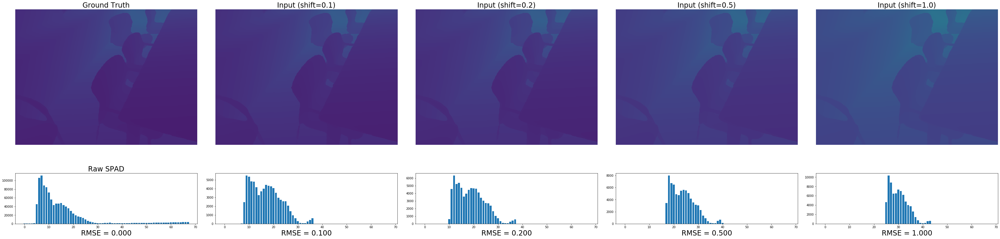

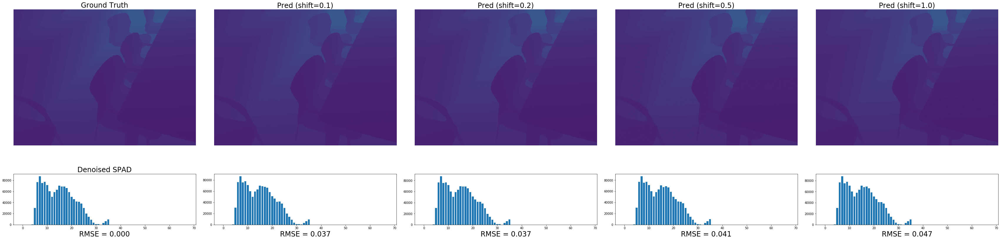

In [125]:
shifts = [0.1, 0.2, 0.5, 1.]
fig_init, fig_pred = run_and_display_gordon([gt+shift for shift in shifts],
                                            [intensity for shift in shifts],
                                            ["shift={}".format(shift) for shift in shifts],
                                            gt, intensity, sid_obj, **spad_types["intensity + falloff + dc"]);
fig_init.savefig("figures/int_fall_dc_init.png")
fig_pred.savefig("figures/int_fall_dc_pred.png")

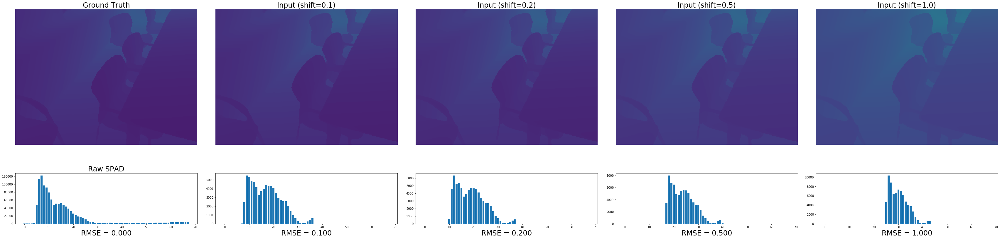

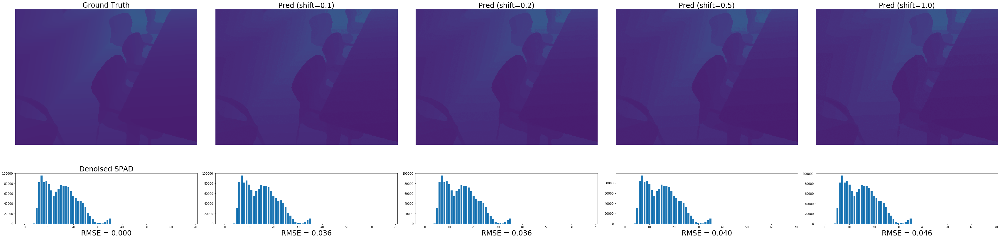

In [126]:
shifts = [0.1, 0.2, 0.5, 1.]
fig_init, fig_pred = \
    run_and_display_gordon([gt+shift for shift in shifts],
                           [intensity for shift in shifts],
                           ["shift={}".format(shift) for shift in shifts],
                           gt, intensity, sid_obj, **spad_types["intensity + falloff + dc + jitter"]);
fig_init.savefig("figures/int_fall_dc_jit_init.png")
fig_pred.savefig("figures/int_fall_dc_jit_pred.png")

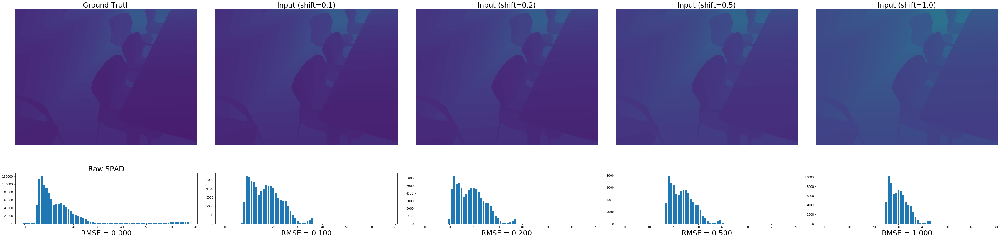

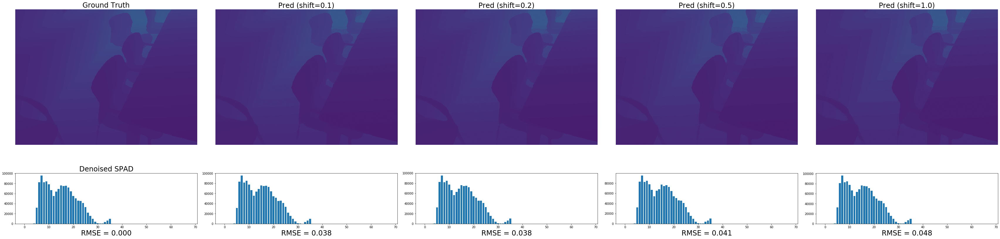

In [127]:
shifts = [0.1, 0.2, 0.5, 1.]
fig_init, fig_pred = \
    run_and_display_gordon([gt+shift for shift in shifts],
                           [intensity for shift in shifts],
                           ["shift={}".format(shift) for shift in shifts],
                           gt, intensity, sid_obj, **spad_types["intensity + falloff + dc + jitter + poisson"]);
fig_init.savefig("figures/int_fall_dc_jit_pois_init.png")
fig_pred.savefig("figures/int_fall_dc_jit_pois_pred.png")

In [62]:
# Depth Shift
shifts = [0.01, 0.1, 0.5, 1.]
inits = [gt + shift for shift in shifts]
summarize_gordon(inits,
                 ["Shift = {}".format(shift) for shift in shifts],
                 gt, intensity, sid_obj, **spad_types["intensity"])
preds = [image_histogram_match(init, gt_hist, weights=intensity, sid_obj=sid_obj)[0] for init in inits]
# Reconstruction
summarize_gordon(preds,
                 ["Output (Shift = {})".format(shift) for shift in shifts],
                 gt, intensity)


TypeError: summarize_gordon() missing 1 required positional argument: 'sid_obj'

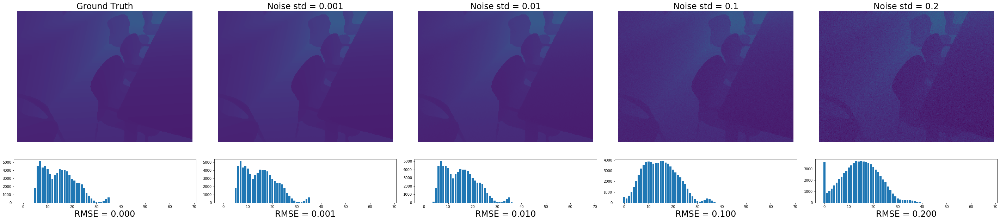

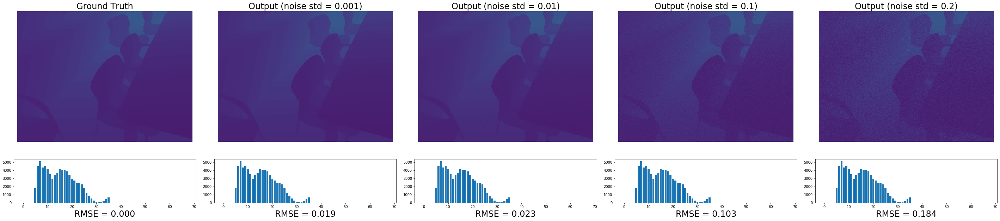

In [22]:
# Noisy Depth
noises = [0.001, 0.01, 0.1, 0.2]
inits = [np.clip(gt + noise*np.random.randn(*gt.shape), a_min=1e-4, a_max=10.) for noise in noises]
gt_index = np.clip(sid_obj.get_sid_index_from_value(gt), a_min=0, a_max=sid_obj.sid_bins-1)
gt_hist, _ = np.histogram(gt_index, weights=intensity, bins=range(sid_obj.sid_bins + 1))
summarize_gordon(inits,
                 ["Noise std = {}".format(noise) for noise in noises],
                 gt, intensity)
preds = [image_histogram_match(init, gt_hist, weights=intensity, sid_obj=sid_obj)[0] for init in inits]
# Reconstruction
summarize_gordon(preds,
                 ["Output (noise std = {})".format(noise) for noise in noises],
                 gt, intensity)

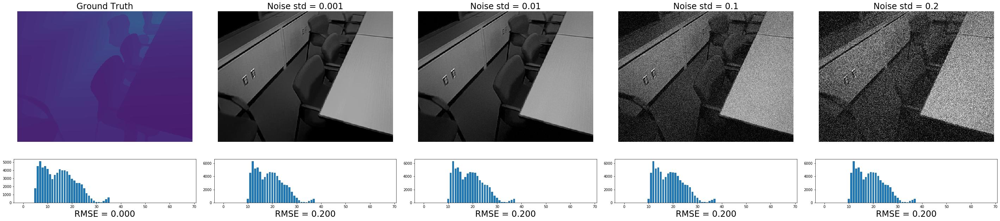

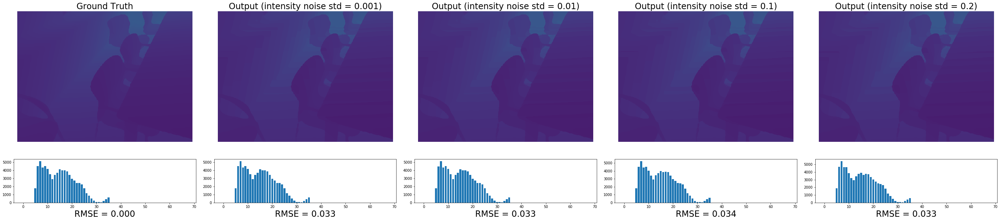

In [39]:
# Noisy Intensities
noises = [0.001, 0.01, 0.1, 0.2]
shift = 0.2
inits = [np.clip(gt + shift, a_min=1e-4, a_max=10.) for _ in range(4)]
intensities = [np.clip(intensity + noise*np.random.randn(*inits[0].shape), a_min=0., a_max=1.) for noise in noises]
gt_index = np.clip(sid_obj.get_sid_index_from_value(gt), a_min=0, a_max=sid_obj.sid_bins-1)
gt_hist, _ = np.histogram(gt_index, weights=intensity, bins=range(sid_obj.sid_bins + 1))
fig, axs = summarize_gordon(inits, ["Noise std = {}".format(noise) for noise in noises], gt, intensity)
for i, noisy_intensity in enumerate(intensities):
    axs[0, i+1].imshow(noisy_intensity, vmin=0., vmax=1., cmap='gray')
    axs[0, i+1].axis('off')
    
preds = [image_histogram_match(inits[0], gt_hist, weights=intensity,
                               sid_obj=sid_obj)[0] for intensity in intensities]
# Reconstruction
summarize_gordon(preds,
                 ["Output (intensity noise std = {})".format(noise) for noise in noises],
                 gt, intensity);

Average time: 0.6549119102501209


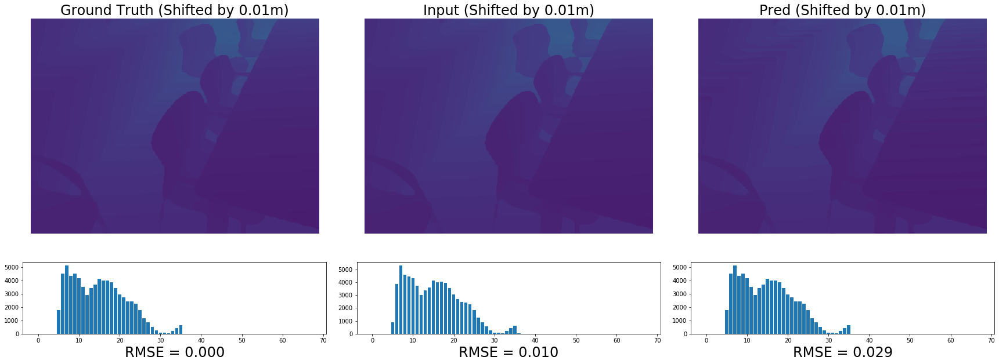

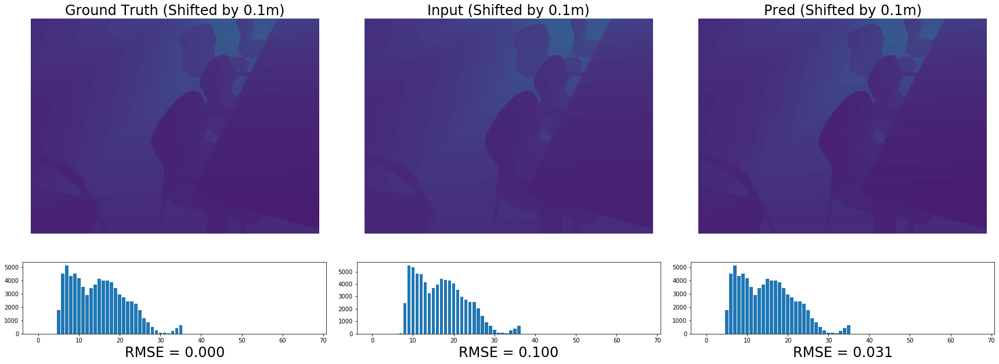

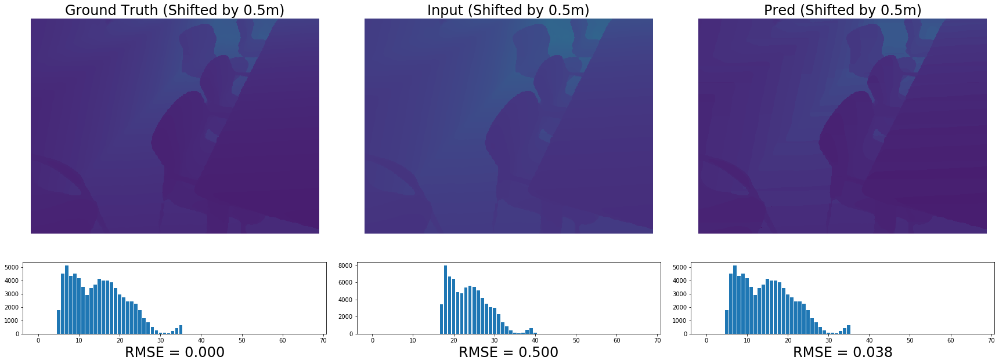

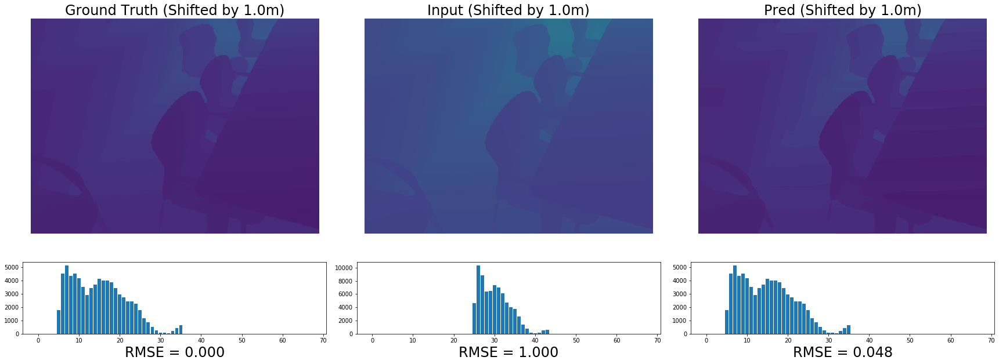

In [7]:
# Shifted
times = [run_and_display(gt + shift, gt, intensity, intensity, sid_obj, "Shifted by {}m".format(shift))
         for shift in [0.01, 0.1, 0.5, 1.]]
print("Average time: {}".format(np.mean(times)))

In [ ]:
# Noisy Intensity
noisy_intensity = np.clip(intensity + 0.05*np.random.randn(*intensity.shape),
                          a_min=0.02, a_max=1.)
times = [run_and_display(gt+0.2, gt, noisy_intensity, intensity, sid_obj, "Noisy Intensity, std=0.05") for _ in range(10)]
print("Average time: {}".format(np.mean(times)))

In [ ]:
# Noisy Depth
ns = np.clip(gt + 0.2*np.random.randn(*gt.shape), a_min=0.001, a_max=10.)
times = [run_and_display(ns, gt, intensity, intensity, sid_obj, "Noisy Depth, std=20cm") for _ in range(10)]
print("Average time: {}".format(np.mean(times)))